# Modeling: Đánh giá nguy cơ mắc bệnh tim bằng AI
* **Nhóm:** 3


## **Mục lục**<a is='Contents'></a>  
* [Giới thiệu](#Introduction)  
* [Tập dữ liệu](#Dataset)  
* [Cài đặt và chuẩn bị](#Setup_and_preliminaries)  
  * [Nhập thư viện](#Import_libraries)  
  * [Các hàm cần thiết](#Necessary_Functions)  
* [Nhập tập dữ liệu](#Importing_dataset)  
* [Xác thực tập dữ liệu](#Validating_the_dataset)  
* [Các đặc trưng liên quan đến bệnh tim](#Heart_Disease_related_features)  
* [Chuyển đổi kiểu dữ liệu của đặc trưng](#Converting_features_data_type)  
* [Bệnh tim: Biến mục tiêu](#Heart_Disease_Target_Variable)  
* [Lựa chọn đặc trưng](#Features_Selection)  
* [Mã hóa danh mục bằng CatBoost](#Categorical_Encoding_with_Catboost)  
* [Chia dữ liệu thành tập huấn luyện và kiểm tra](#Split_data_into_training_and_testing_sets)  
* [Chuẩn hóa đặc trưng cho hồi quy Logistic](#Scale_features_for_Logistic_Regression)  
* [Mô hình cơ bản](#Baseline_Modeling)  
  * [So sánh các chỉ số theo từng lớp](#class_specific_level_Metrics_Comparison)  
  * [Tóm tắt các chỉ số theo từng lớp](#Class_specific_level_Metrics_Summary)  
* [Lựa chọn mô hình](#Model_Selection)  
* [Tối ưu hóa tham số bằng Optuna](#Hyperparameter_Tuning_using_Optuna)  
* [Huấn luyện mô hình tốt nhất (đã tinh chỉnh)](#Fitting_Best_Model_tuned)  
* [Tầm quan trọng của đặc trưng trong mô hình tốt nhất bằng SHAP](#Tuned_Best_Model_Features_Importance_using_SHAP)  
* [Lưu mô hình cuối cùng](#Saving_Final_Model)  

## **Giới thiệu**<a id='Introduction'></a>  
[Quay lại Mục lục](#Contents)  

Trong notebook này, chúng ta sẽ huấn luyện và đánh giá nhiều mô hình học máy để phân loại bệnh tim, bao gồm:  

* Hồi quy Logistic (Logistic Regression)  
* Rừng ngẫu nhiên (Random Forest)  
* XGBoost  
* LightGBM  
* Balanced Bagging  
* Easy Ensemble  
* Balanced Random Forest  
* Balanced Bagging (LightGBM): Sử dụng Balanced Bagging làm Wrapper và LightGBM làm bộ ước lượng cơ sở  
* Easy Ensemble (LightGBM): Sử dụng Easy Ensemble làm Wrapper và LightGBM làm bộ ước lượng cơ sở  

Mục tiêu của chúng ta là dự đoán chính xác nguy cơ mắc bệnh tim bằng các mô hình này. Chúng ta sẽ áp dụng tối ưu hóa tham số bằng `Optuna` để cải thiện hiệu suất của từng mô hình. Ngoài ra, chúng ta sẽ sử dụng các thuật toán `BalancedRandomForestClassifier`, `BalancedBaggingClassifier` và `EasyEnsembleClassifier` từ thư viện `imbalanced-learn` để giải quyết vấn đề mất cân bằng lớp. Những bộ phân loại này sử dụng phương pháp lấy mẫu bootstrap để cân bằng tập dữ liệu, giúp cải thiện khả năng phân loại các lớp thiểu số.  

Bằng cách tập trung vào dữ liệu bị đánh giá thấp, phương pháp này giúp nâng cao hiệu suất của mô hình, làm cho nó đặc biệt phù hợp với các tập dữ liệu mất cân bằng như dự đoán bệnh tim. Thông qua cách tiếp cận toàn diện này, chúng ta hướng đến việc phát triển một mô hình đáng tin cậy và hiệu quả để đánh giá nguy cơ mắc bệnh tim, góp phần cải thiện kết quả sức khỏe cho cộng đồng.

## **Tập dữ liệu**<a id='Dataset'></a>  
[Quay lại Mục lục](#Contents)  

Tập dữ liệu được sử dụng trong notebook này là kết quả của quá trình tiền xử lý dữ liệu toàn diện. Tiền xử lý dữ liệu là một bước quan trọng trong quy trình khoa học dữ liệu, bao gồm việc chuyển đổi và chuẩn bị dữ liệu thô thành định dạng phù hợp hơn cho phân tích. Các nhiệm vụ chính được thực hiện trong quá trình này bao gồm:  

* Xử lý dữ liệu bị thiếu  
* Ánh xạ dữ liệu  
* Làm sạch dữ liệu  
* Kỹ thuật đặc trưng (Feature engineering)  

Những bước này đảm bảo rằng tập dữ liệu được chuẩn bị tốt để phân tích và xây dựng mô hình, giúp tạo ra các mô hình đáng tin cậy và chính xác trong dự đoán nguy cơ mắc bệnh tim.

## **Thiết lập và Chuẩn bị**<a id='Setup_and_preliminaries'></a>  
[Quay lại Mục lục](#Contents)

### **Import libraries**<a id='Import_libraries'></a>
[Contents](#Contents)

In [1]:
# Nhập các thư viện cần thiết:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
import scipy.stats as stats
from scipy.stats import gamma, linregress
from bs4 import BeautifulSoup
import re

# Mô hình học máy
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import category_encoders as ce 
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split

# Đánh giá mô hình
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score, roc_curve
from sklearn.metrics import accuracy_score, classification_report
import shap

# Tinh chỉnh siêu tham số
import optuna

# Xử lý mất cân bằng lớp
from imblearn.ensemble import BalancedRandomForestClassifier, BalancedBaggingClassifier, EasyEnsembleClassifier
from imblearn.metrics import classification_report_imbalanced

# Thiết lập hiển thị cho notebook:
pd.set_option('display.max_columns', None)  # Hiển thị tất cả các cột
pd.set_option('display.max_rows', None)  # Hiển thị tất cả các hàng

# Định dạng số thực với 2 chữ số thập phân: Chúng ta có thể điều chỉnh cài đặt này nếu cần thiết cho các câu trả lời cụ thể trong bài tập này.
# pd.set_option('float_format', '{:.2f}'.format)

# Tắt cảnh báo không cần thiết
import warnings
warnings.filterwarnings('ignore', category=FutureWarning, module='xgboost')
warnings.filterwarnings('ignore', category=FutureWarning, module='imblearn')

C:\Users\ADMIN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### **Necessary  functions**<a id='Necessary_Functions'></a>
[Contents](#Contents)

In [2]:
def summarize_df(df):
    """
    Tạo một DataFrame tóm tắt cho DataFrame đầu vào.

    Tham số:
    df (pd.DataFrame): DataFrame cần được tóm tắt.

    Trả về:
    Một DataFrame chứa các thông tin sau:
        - 'unique_count': Số lượng giá trị duy nhất trong mỗi cột.
        - 'data_types': Kiểu dữ liệu của mỗi cột.
        - 'missing_counts': Số lượng giá trị bị thiếu (NaN) trong mỗi cột.
        - 'missing_percentage': Tỷ lệ phần trăm giá trị bị thiếu trong mỗi cột.
    """
    # Số lượng giá trị duy nhất cho mỗi cột:
    unique_counts = df.nunique()    
    # Kiểu dữ liệu của mỗi cột:
    data_types = df.dtypes    
    # Số lượng giá trị bị thiếu (NaN) trong mỗi cột:
    missing_counts = df.isnull().sum()    
    # Tỷ lệ phần trăm giá trị bị thiếu trong mỗi cột:
    missing_percentage = 100 * df.isnull().mean()    
    # Ghép các thông tin trên vào một DataFrame:
    summary_df = pd.concat([unique_counts, data_types, missing_counts, missing_percentage], axis=1)    
    # Đổi tên cột cho dễ đọc:
    summary_df.columns = ['unique_count', 'data_types', 'missing_counts', 'missing_percentage']   
    # Trả về DataFrame tóm tắt:
    return summary_df

#-----------------------------------------------------------------------------------------------------------------#
# Hàm làm sạch và định dạng nhãn
def clean_label(label):
    # Thay thế bất kỳ ký tự nào không phải chữ cái hoặc số bằng chuỗi rỗng
    label = re.sub(r'[^a-zA-Z0-9\s]', '', label)
    # Thay thế dấu cách bằng dấu gạch dưới
    label = re.sub(r'\s+', '_', label)
    return label

#-----------------------------------------------------------------------------------------------------------------#
def value_counts_with_percentage(df, column_name):
    """
    Tính toán số lần xuất hiện và phần trăm của từng giá trị trong một cột.

    Tham số:
    df (pd.DataFrame): DataFrame chứa dữ liệu.
    column_name (str): Tên cột cần phân tích.

    Trả về:
    Một DataFrame với hai cột:
        - 'Count': Số lần xuất hiện của từng giá trị.
        - 'Percentage': Tỷ lệ phần trăm của từng giá trị.
    """
    # Tính số lần xuất hiện
    counts = df[column_name].value_counts(dropna=False)
    
    # Tính phần trăm
    percentages = df[column_name].value_counts(dropna=False, normalize=True) * 100
    
    # Kết hợp số lần xuất hiện và phần trăm vào một DataFrame
    result = pd.DataFrame({
        'Count': counts,
        'Percentage': percentages
    })
    
    return result

#-----------------------------------------------------------------------------------------------------------------#

def plot_heart_disease_distribution(df, target):
    """
    Vẽ biểu đồ thanh ngang xếp chồng để thể hiện phân bố của biến mục tiêu 'Heart Disease'.
    
    Tham số:
    df (pd.DataFrame): DataFrame chứa dữ liệu.
    target (str): Tên cột mục tiêu.
    """
    # Tạo bảng crosstab
    crosstab = pd.crosstab(df[target], df[target])

    # Vẽ biểu đồ
    fig, ax = plt.subplots(figsize=(16, 6))  # Tăng chiều rộng của hình vẽ
    crosstab.plot(kind='barh', stacked=True, color=['green', 'red'], ax=ax)
    ax.set_title(f'Phân bố {target}')
    ax.set_xlabel('Số lượng')
    ax.set_ylabel(target)
    ax.grid(True, axis='x')
    ax.set_axisbelow(True)  # Đặt lưới phía sau các thanh

    # Thêm nhãn bên ngoài các thanh
    for i in range(len(crosstab)):
        total = sum(crosstab.iloc[i])
        label_no = f"Không ({crosstab.iloc[i, 0] / 1000:.1f}K)"
        label_yes = f"Có ({crosstab.iloc[i, 1] / 1000:.1f}K)"
        ax.text(total + 5000, i, f'{label_no}, {label_yes}', ha='left', va='center', color='black')

    # Điều chỉnh giới hạn để đảm bảo nhãn vừa với biểu đồ
    ax.set_xlim(right=ax.get_xlim()[1] + 100000)

    # Di chuyển chú thích ra ngoài khu vực biểu đồ
    ax.legend(title=target, loc='center left', bbox_to_anchor=(1, 0.5))
    
    # Đảm bảo nhãn và khu vực vẽ biểu đồ phù hợp với kích thước hình vẽ
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

## **Importing dataset**<a id='Importing_dataset'></a>
[Contents](#Contents)

In [3]:
df = pd.read_csv('brfss2022_data_wrangling_output.csv')

## **Xác thực Tập dữ liệu**<a id='Validating_the_dataset'></a>  
[Contents](#Contents)

In [4]:

df.head()

,heart_disease,gender,race,general_health,health_care_provider,could_not_afford_to_see_doctor,length_of_time_since_last_routine_checkup,ever_diagnosed_with_heart_attack,ever_diagnosed_with_a_stroke,ever_told_you_had_a_depressive_disorder,ever_told_you_have_kidney_disease,ever_told_you_had_diabetes,BMI,difficulty_walking_or_climbing_stairs,physical_health_status,mental_health_status,asthma_Status,smoking_status,binge_drinking_status,exercise_status_in_past_30_Days,age_category,sleep_category,drinks_category
0,no,female,white_only_non_hispanic,very_good,yes_only_one,no,past_year,no,no,no,no,yes,overweight_bmi_25_to_29_9,no,zero_days_not_good,zero_days_not_good,never_asthma,never_smoked,no,no,Age_80_or_older,normal_sleep_6_to_8_hours,did_not_drink
1,no,male,white_only_non_hispanic,excellent,more_than_one,no,never,no,no,no,no,no,overweight_bmi_25_to_29_9,no,zero_days_not_good,zero_days_not_good,never_asthma,never_smoked,no,no,Age_80_or_older,normal_sleep_6_to_8_hours,did_not_drink
2,no,male,white_only_non_hispanic,very_good,yes_only_one,no,past_year,no,no,no,no,no,overweight_bmi_25_to_29_9,no,1_to_13_days_not_good,1_to_13_days_not_good,never_asthma,never_smoked,no,yes,Age_55_to_59,short_sleep_4_to_5_hours,did_not_drink
3,no,female,white_only_non_hispanic,excellent,yes_only_one,no,past_year,no,no,no,no,no,normal_weight_bmi_18_5_to_24_9,no,zero_days_not_good,zero_days_not_good,current_asthma,current_smoker_some_days,no,yes,Age_70_to_74,normal_sleep_6_to_8_hours,did_not_drink
4,no,male,white_only_non_hispanic,fair,more_than_one,no,past_year,no,no,no,no,no,normal_weight_bmi_18_5_to_24_9,no,1_to_13_days_not_good,zero_days_not_good,never_asthma,never_smoked,no,yes,Age_40_to_44,long_sleep_9_to_10_hours,low_consumption_1.01_to_5_drinks


In [5]:
#Bây giờ, hãy xem kích thước của DataFrame:
shape = df.shape
print("Số hàng:", shape[0], "\nSố cột:", shape[1])

Số hàng: 445132 
Số cột: 23


## **Các đặc điểm liên quan đến bệnh tim**<a id='Heart_Disease_related_features'></a>  
[Contents](#Contents)  

Sau nhiều ngày nghiên cứu và phân tích các đặc điểm của tập dữ liệu, chúng tôi đã xác định các đặc điểm chính để đánh giá bệnh tim như sau:  

### **Biến mục tiêu (Biến phụ thuộc):**  
- **Heart_disease** (*Từng được chẩn đoán mắc bệnh đau thắt ngực hoặc bệnh tim mạch vành*): "Ever_Diagnosed_with_Angina_or_Coronary_Heart_Disease"  

### **Nhân khẩu học:**  
- **Gender** (*Giới tính*): Are_you_male_or_female  
- **Race** (*Chủng tộc*): Computed_race_groups_used_for_internet_prevalence_tables  
- **Age** (*Tuổi*): Imputed_Age_value_collapsed_above_80  

### **Tiền sử bệnh:**  
- **General_Health** (*Tình trạng sức khỏe tổng quát*)  
- **Have_Personal_Health_Care_Provider** (*Có nhà cung cấp dịch vụ chăm sóc sức khỏe cá nhân*)  
- **Could_Not_Afford_To_See_Doctor** (*Không đủ khả năng tài chính để đi khám bác sĩ*)  
- **Length_of_time_since_last_routine_checkup** (*Khoảng thời gian từ lần kiểm tra sức khỏe định kỳ gần nhất*)  
- **Ever_Diagnosed_with_Heart_Attack** (*Từng được chẩn đoán bị đau tim*)  
- **Ever_Diagnosed_with_a_Stroke** (*Từng được chẩn đoán bị đột quỵ*)  
- **Ever_told_you_had_a_depressive_disorder** (*Từng được chẩn đoán mắc rối loạn trầm cảm*)  
- **Ever_told_you_have_kidney_disease** (*Từng được chẩn đoán mắc bệnh thận*)  
- **Ever_told_you_had_diabetes** (*Từng được chẩn đoán mắc bệnh tiểu đường*)  
- **Reported_Weight_in_Pounds** (*Cân nặng báo cáo theo đơn vị pound*)  
- **Reported_Height_in_Feet_and_Inches** (*Chiều cao báo cáo theo đơn vị feet và inch*)  
- **Computed_body_mass_index_categories** (*Chỉ số khối cơ thể (BMI) tính toán được*)  
- **Difficulty_Walking_or_Climbing_Stairs** (*Gặp khó khăn khi đi bộ hoặc leo cầu thang*)  
- **Computed_Physical_Health_Status** (*Tình trạng sức khỏe thể chất tính toán được*)  
- **Computed_Mental_Health_Status** (*Tình trạng sức khỏe tâm thần tính toán được*)  
- **Computed_Asthma_Status** (*Tình trạng hen suyễn tính toán được*)  

### **Lối sống:**  
- **Leisure_Time_Physical_Activity_Calculated_Variable** (*Mức độ hoạt động thể chất trong thời gian rảnh*)  
- **Smoked_at_Least_100_Cigarettes** (*Từng hút ít nhất 100 điếu thuốc*)  
- **Computed_Smoking_Status** (*Tình trạng hút thuốc tính toán được*)  
- **Binge_Drinking_Calculated_Variable** (*Tình trạng uống rượu bia quá mức*)  
- **Computed_number_of_drinks_of_alcohol_beverages_per_week** (*Số lượng đồ uống có cồn tiêu thụ mỗi tuần tính toán được*)  
- **Exercise_in_Past_30_Days** (*Có tập thể dục trong 30 ngày qua không*)  
- **How_Much_Time_Do_You_Sleep** (*Bạn ngủ bao nhiêu giờ mỗi ngày*)

In [6]:
#Hãy chạy đoạn mã dưới đây để kiểm tra lại từng đặc điểm, bao gồm số lượng và tỷ lệ dữ liệu bị thiếu, số giá trị duy nhất, và kiểu dữ liệu:
summarize_df(df)

,unique_count,data_types,missing_counts,missing_percentage
heart_disease,2,object,0,0.0
gender,3,object,0,0.0
race,7,object,0,0.0
general_health,5,object,0,0.0
health_care_provider,3,object,0,0.0
could_not_afford_to_see_doctor,2,object,0,0.0
length_of_time_since_last_routine_checkup,5,object,0,0.0
ever_diagnosed_with_heart_attack,2,object,0,0.0
ever_diagnosed_with_a_stroke,2,object,0,0.0
ever_told_you_had_a_depressive_disorder,2,object,0,0.0


## **Chuyển đổi kiểu dữ liệu của các đặc điểm**<a id='Converting_features_data_type'></a>  
[Contents](#Contents)  

Trong pandas, kiểu dữ liệu `object` được sử dụng cho dữ liệu dạng văn bản hoặc dữ liệu hỗn hợp. Khi một cột chứa dữ liệu phân loại (categorical data), việc chuyển đổi nó sang kiểu dữ liệu danh mục (`category`) có thể mang lại nhiều lợi ích.  

### **Lợi ích của việc chuyển đổi sang kiểu dữ liệu danh mục:**  
- **Tiết kiệm bộ nhớ:** Kiểu dữ liệu danh mục giúp sử dụng bộ nhớ hiệu quả hơn. Thay vì lưu từng chuỗi riêng biệt, pandas chỉ lưu các danh mục và sử dụng mã số nguyên để đại diện cho các giá trị.  
- **Cải thiện hiệu suất:** Các thao tác trên dữ liệu danh mục có thể nhanh hơn vì pandas có thể sử dụng mã số nguyên bên dưới.  
- **Ý nghĩa rõ ràng hơn:** Việc chuyển đổi sang kiểu danh mục giúp làm rõ bản chất phân loại của dữ liệu, cải thiện khả năng đọc mã và giảm nguy cơ xử lý nhầm dữ liệu phân loại như dữ liệu liên tục.

In [7]:
# Chuyển đổi các cột sang kiểu danh mục
categorical_columns = df.columns  # giả sử tất cả các cột cần chuyển sang kiểu danh mục
df[categorical_columns] = df[categorical_columns].astype('category')

summarize_df(df)

,unique_count,data_types,missing_counts,missing_percentage
heart_disease,2,category,0,0.0
gender,3,category,0,0.0
race,7,category,0,0.0
general_health,5,category,0,0.0
health_care_provider,3,category,0,0.0
could_not_afford_to_see_doctor,2,category,0,0.0
length_of_time_since_last_routine_checkup,5,category,0,0.0
ever_diagnosed_with_heart_attack,2,category,0,0.0
ever_diagnosed_with_a_stroke,2,category,0,0.0
ever_told_you_had_a_depressive_disorder,2,category,0,0.0


Tốt! Giờ tất cả các đặc trưng đã được chuyển sang kiểu dữ liệu danh mục, hãy chuyển sang bước tiếp theo. 🚀

## **Bệnh tim: Biến mục tiêu**<a id='Heart_Disease_Target_Variable'></a>  
[Danh mục nội dung](#Contents)

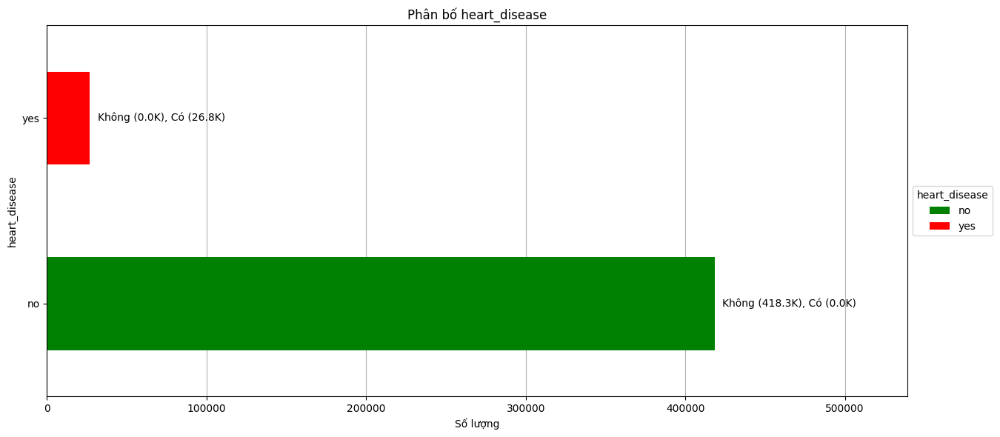

In [8]:
# Được rồi, bây giờ hãy xem phân bố của bệnh tim:  
plot_heart_disease_distribution(df, 'heart_disease')

### **Phân tích phân bố**  
* Có sự mất cân bằng đáng kể giữa hai nhóm.  
* Phần lớn số người không mắc bệnh tim (`418.3K`), trong khi số người mắc bệnh tim ít hơn nhiều (`26.8K`).  
* Sự mất cân bằng này có thể quan sát rõ trong biểu đồ, với thanh màu xanh lá cây dài hơn đáng kể so với thanh màu đỏ.  

### **Vấn đề mất cân bằng**  
* **Thiên vị mô hình:** Khi huấn luyện mô hình phân loại trên tập dữ liệu mất cân bằng này, mô hình có thể bị thiên vị và dự đoán nhóm đa số (không mắc bệnh tim) thường xuyên hơn do nhóm này xuất hiện nhiều hơn trong dữ liệu huấn luyện.  
* **Chỉ số đánh giá hiệu suất:** Các chỉ số đánh giá phổ biến như độ chính xác có thể gây hiểu lầm trên tập dữ liệu mất cân bằng. Ví dụ, một mô hình luôn dự đoán "Không mắc bệnh tim" có thể có độ chính xác cao vì nhóm đa số được đại diện tốt. Tuy nhiên, mô hình này sẽ thất bại trong việc xác định những người mắc bệnh tim, điều này rất quan trọng trong các ứng dụng y tế.  
* **Recall và Precision:** Các chỉ số như recall (độ nhạy) và precision (độ chính xác) có ý nghĩa hơn trong bối cảnh này. Recall đo lường khả năng nhận diện các trường hợp dương tính thực sự (mắc bệnh tim), trong khi precision đo lường độ chính xác của các dự đoán dương tính. Trong tập dữ liệu mất cân bằng, một mô hình có thể có recall thấp đối với nhóm thiểu số (mắc bệnh tim) ngay cả khi độ chính xác tổng thể cao.  

### **Chiến lược giải quyết mất cân bằng**  
Các mô hình như `BalancedRandomForestClassifier`, `BalancedBaggingClassifier` hoặc `EasyEnsembleClassifier` trong thư viện `imbalanced-learn` giúp xử lý hiệu quả vấn đề mất cân bằng bằng cách sử dụng phương pháp lấy mẫu bootstrap để cân bằng tập dữ liệu. Điều này giúp cải thiện khả năng phân loại nhóm thiểu số, làm cho mô hình trở nên mạnh mẽ hơn, đặc biệt phù hợp với các bài toán như dự đoán bệnh tim.

## **Lựa chọn đặc trưng (Feature Selection)**<a id='Features_Selection'></a>  
[Contents](#Contents)

In [9]:
# Xác định biến mục tiêu:  
target = 'heart_disease'  

# Chuyển đổi biến mục tiêu thành giá trị số:  
df[target] = df[target].apply(lambda x: 1 if x == 'yes' else 0).astype('int')

In [10]:
df.head()

,heart_disease,gender,race,general_health,health_care_provider,could_not_afford_to_see_doctor,length_of_time_since_last_routine_checkup,ever_diagnosed_with_heart_attack,ever_diagnosed_with_a_stroke,ever_told_you_had_a_depressive_disorder,ever_told_you_have_kidney_disease,ever_told_you_had_diabetes,BMI,difficulty_walking_or_climbing_stairs,physical_health_status,mental_health_status,asthma_Status,smoking_status,binge_drinking_status,exercise_status_in_past_30_Days,age_category,sleep_category,drinks_category
0,0,female,white_only_non_hispanic,very_good,yes_only_one,no,past_year,no,no,no,no,yes,overweight_bmi_25_to_29_9,no,zero_days_not_good,zero_days_not_good,never_asthma,never_smoked,no,no,Age_80_or_older,normal_sleep_6_to_8_hours,did_not_drink
1,0,male,white_only_non_hispanic,excellent,more_than_one,no,never,no,no,no,no,no,overweight_bmi_25_to_29_9,no,zero_days_not_good,zero_days_not_good,never_asthma,never_smoked,no,no,Age_80_or_older,normal_sleep_6_to_8_hours,did_not_drink
2,0,male,white_only_non_hispanic,very_good,yes_only_one,no,past_year,no,no,no,no,no,overweight_bmi_25_to_29_9,no,1_to_13_days_not_good,1_to_13_days_not_good,never_asthma,never_smoked,no,yes,Age_55_to_59,short_sleep_4_to_5_hours,did_not_drink
3,0,female,white_only_non_hispanic,excellent,yes_only_one,no,past_year,no,no,no,no,no,normal_weight_bmi_18_5_to_24_9,no,zero_days_not_good,zero_days_not_good,current_asthma,current_smoker_some_days,no,yes,Age_70_to_74,normal_sleep_6_to_8_hours,did_not_drink
4,0,male,white_only_non_hispanic,fair,more_than_one,no,past_year,no,no,no,no,no,normal_weight_bmi_18_5_to_24_9,no,1_to_13_days_not_good,zero_days_not_good,never_asthma,never_smoked,no,yes,Age_40_to_44,long_sleep_9_to_10_hours,low_consumption_1.01_to_5_drinks


In [11]:
# Xác định các đặc trưng cần chọn:
features = ['gender', 'race', 'general_health', 'health_care_provider', 
            'could_not_afford_to_see_doctor', 'length_of_time_since_last_routine_checkup',
            'ever_diagnosed_with_heart_attack', 'ever_diagnosed_with_a_stroke',
            'ever_told_you_had_a_depressive_disorder', 'ever_told_you_have_kidney_disease',
            'ever_told_you_had_diabetes', 'BMI', 'difficulty_walking_or_climbing_stairs',
            'physical_health_status', 'mental_health_status', 'asthma_Status',
            'smoking_status', 'binge_drinking_status', 'exercise_status_in_past_30_Days',
            'age_category', 'sleep_category', 'drinks_category']

# Tách đặc trưng và biến mục tiêu
X = df[features]
y = df[target]


## **Mã hóa danh mục với CatBoost**<a id='Categorical_Encoding_with_Catboost'></a>  
[Contents](#Contents)  

Nhiều thuật toán học máy yêu cầu dữ liệu ở dạng số. Do đó, trước khi huấn luyện mô hình hoặc tính toán hệ số tương quan Pearson hay thông tin tương hỗ (prediction power), chúng ta cần chuyển đổi dữ liệu danh mục thành dạng số. Có nhiều phương pháp mã hóa danh mục khác nhau, trong đó CatBoost là một phương pháp phổ biến.  

CatBoost là một phương pháp mã hóa danh mục dựa trên giá trị mục tiêu (target-based encoding). Đây là một phương pháp mã hóa có giám sát, chuyển đổi các cột danh mục theo giá trị của biến mục tiêu, hỗ trợ cả biến mục tiêu nhị phân và liên tục.  

### **Mã hóa Target Encoding và vấn đề rò rỉ dữ liệu (Target Leakage)**  
Mã hóa target encoding thay thế một giá trị danh mục bằng giá trị trung bình của biến mục tiêu tương ứng với danh mục đó trong tập huấn luyện, kết hợp với xác suất xuất hiện biến mục tiêu trên toàn bộ tập dữ liệu. Tuy nhiên, phương pháp này có thể gây ra hiện tượng **rò rỉ mục tiêu** (target leakage) vì giá trị của biến mục tiêu được sử dụng để dự đoán chính nó. Điều này có thể dẫn đến **quá khớp** (overfitting), làm cho mô hình hoạt động kém khi áp dụng vào dữ liệu mới.  

### **Mã hóa CatBoost và cách khắc phục rò rỉ dữ liệu**  
Mã hóa CatBoost tương tự target encoding nhưng bổ sung một nguyên tắc **thứ tự quan sát** nhằm khắc phục vấn đề rò rỉ dữ liệu. Nó hoạt động theo nguyên tắc giống như xác thực dữ liệu chuỗi thời gian (time-series validation).  

Cụ thể, giá trị mã hóa của biến danh mục được tính toán dựa trên dữ liệu **trước đó** trong tập dữ liệu. Nghĩa là, xác suất mục tiêu cho một giá trị danh mục tại một dòng dữ liệu chỉ được tính từ các dòng dữ liệu **đứng trước nó**. Cách tiếp cận này giúp hạn chế việc mô hình "nhìn thấy" thông tin trong tương lai, từ đó giảm thiểu khả năng quá khớp và cải thiện tính tổng quát của mô hình.

In [12]:
# Khởi tạo bộ mã hóa CatBoost:  
cbe_encoder = ce.CatBoostEncoder()  

# Huấn luyện và chuyển đổi tập dữ liệu:  
cbe_encoder.fit(X, y)  

# Thay thế các cột danh mục ban đầu bằng các cột đã được mã hóa:  
X_cbe = cbe_encoder.transform(X)

## **Chia dữ liệu thành tập huấn luyện và kiểm tra**<a id='Split_data_into_training_and_testing_sets'></a>  
[Contents](#Contents)

In [13]:
#train, test, split
X_train, X_test, y_train, y_test = train_test_split(X_cbe,
                                                    y,
                                                    test_size=0.20, 
                                                    random_state=1981)

## **Chuẩn hóa đặc trưng cho Hồi quy Logistic**<a id='Scale_features_for_Logistic_Regression'></a>  
[Contents](#Contents)

In [14]:
# Chuẩn hóa đặc trưng cho Hồi quy Logistic:  
scaler = StandardScaler()  
X_train_scaled = scaler.fit_transform(X_train)  
X_test_scaled = scaler.transform(X_test)

## **Mô hình Cơ bản**<a id='Baseline_Modeling'></a>  
[Contents](#Contents)  

Tại đây, chúng ta sẽ huấn luyện các mô hình dưới đây và so sánh hiệu suất của chúng trên từng lớp cụ thể:  

* Hồi quy Logistic (Logistic Regression)  
* Rừng ngẫu nhiên (Random Forest)  
* XGBoost  
* LightGBM  
* Balanced Bagging  
* Easy Ensemble  
* Balanced Random Forest  
* Balanced Bagging (LightGBM): Balanced Bagging được sử dụng làm trình bao bọc (wrapper) và LightGBM làm bộ ước lượng cơ sở  
* Easy Ensemble (LightGBM): Easy Ensemble được sử dụng làm trình bao bọc (wrapper) và LightGBM làm bộ ước lượng cơ sở  

In [15]:
# Khởi tạo các mô hình  
models = {
    'Hồi quy Logistic': LogisticRegression(random_state=1981),
    'Rừng ngẫu nhiên': RandomForestClassifier(n_jobs=-1, random_state=1981),  # Sử dụng xử lý song song
    'LightGBM': LGBMClassifier(n_jobs=-1, random_state=1981),
    'XGBoost': XGBClassifier(n_jobs=-1, random_state=1981, use_label_encoder=False, eval_metric='logloss'),
    'Balanced Bagging': BalancedBaggingClassifier(random_state=1981),
    'Easy Ensemble': EasyEnsembleClassifier(random_state=1981),
    'Balanced Random Forest': BalancedRandomForestClassifier(random_state=1981),
    'Balanced Bagging (LightGBM)': BalancedBaggingClassifier(estimator=LGBMClassifier(n_jobs=-1, random_state=1981), random_state=1981),
    'Easy Ensemble (LightGBM)': EasyEnsembleClassifier(estimator=LGBMClassifier(n_jobs=-1, random_state=1981), random_state=1981)
}

### **So sánh các chỉ số theo từng lớp**<a id='class_specific_level_Metrics_Comparison'></a>  
[Contents](#Contents)

In [16]:
# Tạo một DataFrame để lưu trữ các chỉ số đánh giá mô hình
metrics_df = pd.DataFrame()

# Huấn luyện và đánh giá các mô hình
for name, model in models.items():
    if name == 'Logistic Regression':
        # Huấn luyện mô hình hồi quy logistic với dữ liệu đã được chuẩn hóa
        model.fit(X_train_scaled, y_train)
        y_pred = model.predict(X_test_scaled)  # Dự đoán nhãn đầu ra
        y_pred_proba = model.predict_proba(X_test_scaled)[:, 1]  # Xác suất dự đoán của lớp dương (1)
    else:
        # Huấn luyện các mô hình khác với dữ liệu chưa chuẩn hóa
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Tính các chỉ số đánh giá mô hình
    accuracy = accuracy_score(y_test, y_pred)  # Độ chính xác
    precision = precision_score(y_test, y_pred, average=None)  # Độ chính xác theo từng lớp
    recall = recall_score(y_test, y_pred, average=None)  # Độ nhạy theo từng lớp
    f1 = f1_score(y_test, y_pred, average=None)  # Chỉ số F1-score theo từng lớp
    roc_auc = roc_auc_score(y_test, y_pred_proba)  # Điểm ROC AUC tổng thể
    
    # Thêm các chỉ số đánh giá vào DataFrame bằng cách sử dụng pd.concat
    model_metrics = pd.DataFrame({
        'Model': [name] * len(precision),  # Tên mô hình
        'Class': list(range(len(precision))),  # Nhãn của từng lớp
        'Accuracy': [accuracy] * len(precision),  # Độ chính xác chung cho từng lớp
        'Precision': precision,  # Độ chính xác
        'Recall': recall,  # Độ nhạy
        'F1 Score': f1,  # Chỉ số F1-score
        'ROC AUC': [roc_auc] * len(precision)  # Điểm ROC AUC chung
    })
    metrics_df = pd.concat([metrics_df, model_metrics], ignore_index=True)

# Hiển thị DataFrame chứa kết quả đánh giá của các mô hình
metrics_df


[LightGBM] [Info] Number of positive: 21378, number of negative: 334727
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016212 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 356105, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.060033 -> initscore=-2.750953
[LightGBM] [Info] Start training from score -2.750953


C:\Users\ADMIN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\xgboost\training.py:183: UserWarning: [13:02:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[LightGBM] [Info] Number of positive: 21442, number of negative: 21442
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002260 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 42884, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 21162, number of negative: 21162
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002213 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 42324, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000

C:\Users\ADMIN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\ADMIN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\ADMIN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\ADMIN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-pac

[LightGBM] [Info] Number of positive: 21378, number of negative: 21378
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001839 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 42756, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 21378, number of negative: 21378
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002076 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 42756, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000

C:\Users\ADMIN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\ADMIN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\ADMIN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\ADMIN\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-pac

,Model,Class,Accuracy,Precision,Recall,F1 Score,ROC AUC
0,Hồi quy Logistic,0,0.942950,0.952463,0.988589,0.970190,0.881225
1,Hồi quy Logistic,1,0.942950,0.576377,0.239351,0.338241,0.881225
2,Rừng ngẫu nhiên,0,0.939535,0.951774,0.985551,0.968368,0.841808
3,Rừng ngẫu nhiên,1,0.939535,0.508143,0.230131,0.316791,0.841808
4,LightGBM,0,0.943624,0.952778,0.988984,0.970543,0.884863
5,LightGBM,1,0.943624,0.589938,0.244330,0.345547,0.884863
6,XGBoost,0,0.942984,0.953154,0.987836,0.970185,0.881382
7,XGBoost,1,0.942984,0.572869,0.251521,0.349564,0.881382
8,Balanced Bagging,0,0.839273,0.975463,0.850234,0.908554,0.847909
9,Balanced Bagging,1,0.839273,0.224994,0.670293,0.336902,0.847909


### **Tóm tắt các chỉ số theo từng lớp**<a id='Class_specific_level_Metrics_Summary'></a>
[Contents](#Contents)


* **Recall cao, Precision và F1 Score thấp:**  
  - Phần lớn các mô hình có recall thấp đối với lớp 1 (bệnh nhân mắc bệnh tim), ngoại trừ các mô hình Balanced Bagging, Easy Ensemble, Balanced Random Forest và các mô hình này khi kết hợp với LightGBM.  
  - Điều này cho thấy hầu hết các mô hình gặp khó khăn trong việc nhận diện các trường hợp dương tính (bệnh nhân mắc bệnh tim), dẫn đến số lượng đáng kể các trường hợp âm tính giả (bệnh nhân mắc bệnh tim nhưng bị phân loại nhầm thành không mắc bệnh).  

* **Balanced Bagging và Easy Ensemble:**  
  - Các mô hình Balanced Bagging, Easy Ensemble và Balanced Random Forest được thiết kế để xử lý vấn đề mất cân bằng lớp bằng cách cân bằng dữ liệu trong quá trình huấn luyện.  
  - Hiệu suất:  
    - Chúng đạt recall cao hơn đối với lớp 1, tức là có khả năng nhận diện phần lớn các trường hợp dương tính thực sự.  
    - Đổi lại, precision thường thấp hơn, dẫn đến F1 Score giảm.  

* **Ý nghĩa trong bối cảnh y tế:**  
  - Trong lĩnh vực y tế, recall cao là rất quan trọng vì cần phát hiện càng nhiều trường hợp dương tính thực sự càng tốt, ngay cả khi phải chấp nhận một số dương tính giả.  
  - Việc bỏ sót một bệnh nhân thực sự mắc bệnh tim (âm tính giả) có thể nghiêm trọng hơn so với việc chẩn đoán nhầm một người khỏe mạnh là mắc bệnh (dương tính giả).  

* **Sử dụng LightGBM làm bộ ước lượng cơ sở:**  
  - **Hiệu suất với LightGBM:**  
    - Khi sử dụng LightGBM làm bộ ước lượng cơ sở trong Balanced Bagging và Easy Ensemble, recall của lớp 1 được cải thiện đáng kể.  
    - Các mô hình này cũng có điểm ROC AUC tốt hơn (0.885894 và 0.885778), cho thấy sự cân bằng tốt giữa độ nhạy (sensitivity) và độ đặc hiệu (specificity).  
    - LightGBM là một thuật toán boosting mạnh mẽ, được biết đến với hiệu suất cao và khả năng tối ưu hóa tốt, giúp cải thiện các chỉ số đánh giá tổng thể.  
  - **Cải thiện:**  
    - Khi sử dụng Easy Ensemble với LightGBM, recall cho lớp 1 (bệnh nhân mắc bệnh tim) tăng đáng kể từ 24.4% (khi dùng LightGBM riêng lẻ) lên 80.7%.  
    - ROC AUC cũng tăng từ 88.4% lên 88.6%, cho thấy mô hình có khả năng cân bằng tốt giữa việc nhận diện đúng các trường hợp dương tính thực sự và giảm thiểu dương tính giả.  

* **Ứng dụng thực tiễn: Nhiệm vụ phân loại bệnh tim:**  
  - Việc xác định đúng bệnh nhân mắc bệnh tim (dương tính thực sự) là cực kỳ quan trọng.  
  - Recall cao thường được ưu tiên hơn, ngay cả khi phải chấp nhận nhiều dương tính giả hơn.  
  - Recall cao đảm bảo hầu hết các bệnh nhân mắc bệnh tim được xác định, giúp can thiệp và điều trị sớm.  
  - Dương tính giả, mặc dù không lý tưởng, nhưng có thể được xử lý bằng các xét nghiệm bổ sung và đánh giá y tế chi tiết hơn.  

* **Kết luận:**  
  - Các mô hình Balanced Bagging, Easy Ensemble và Balanced Random Forest, đặc biệt khi kết hợp với LightGBM làm bộ ước lượng cơ sở, cung cấp sự cân bằng tốt giữa việc xác định đúng các trường hợp mắc bệnh tim và duy trì tỷ lệ dương tính giả ở mức hợp lý.  
  - Đối với một ứng dụng y tế như dự đoán bệnh tim, các phương pháp này giúp phát hiện hầu hết các trường hợp mắc bệnh, cho phép can thiệp y tế kịp thời, điều này rất quan trọng đối với sức khỏe bệnh nhân.  



## **Lựa chọn mô hình**<a id='Model_Selection'></a>  
[Contents](#Contents)  

* Dựa trên các chỉ số trên, **mô hình Easy Ensemble (LightGBM)** là lựa chọn tốt nhất làm mô hình cuối cùng:  
    * Độ chính xác (Accuracy): `0.793546`  
    * Độ chính xác theo lớp (Precision): `0.201685`  
    * Độ nhạy (Recall): `0.807671`  
    * Điểm F1 (F1 Score): `0.322771`  
    * Diện tích dưới đường cong ROC (ROC AUC): `0.885778`  

* **Tại sao chọn Easy Ensemble (LightGBM)?**  
    * **Độ nhạy cao `(0.807671)`**: Đảm bảo xác định được phần lớn các trường hợp dương tính thực sự (bệnh nhân mắc bệnh tim).  
    * **Chỉ số ROC AUC tốt `(0.885778)`**: Cho thấy mô hình có khả năng phân biệt tốt giữa các lớp.  
    * **Xử lý tốt vấn đề mất cân bằng lớp**: Easy Ensemble giúp cân bằng dữ liệu, một thách thức phổ biến trong các bộ dữ liệu y tế.

## **Điều chỉnh siêu tham số bằng Optuna**<a id='Hyperparameter_Tuning_using_Optuna'></a>  
[Contents](#Contents)

In [17]:
import time  # Thư viện để đo thời gian thực thi
import warnings  # Thư viện để ẩn cảnh báo
import optuna
import lightgbm as lgb
import logging
from sklearn.model_selection import cross_val_score
from imblearn.ensemble import EasyEnsembleClassifier
from lightgbm import LGBMClassifier

# Ẩn tất cả cảnh báo
warnings.filterwarnings("ignore")

# Cấu hình logging để ẩn các thông báo dưới mức WARNING
logging.basicConfig(level=logging.CRITICAL)

start = time.time()  # Ghi nhận thời điểm bắt đầu tối ưu hóa

def objective(trial):
    """
    Hàm mục tiêu để Optuna tối ưu hóa siêu tham số cho mô hình Easy Ensemble (LightGBM).
    """

    # Xác định không gian tìm kiếm siêu tham số:
    params = {
        'n_estimators': trial.suggest_categorical('n_estimators', [10, 50, 100, 500, 1000, 5000]),  # Số lượng cây
        'learning_rate': trial.suggest_categorical('learning_rate', [0.001, 0.01, 0.05, 0.1, 0.3, 0.5, 0.7, 1]),  # Tốc độ học
        'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt', 'dart', 'goss']),  # Loại boosting
        'num_leaves': trial.suggest_int('num_leaves', 2, 256),  # Số lá của mỗi cây
        'max_depth': trial.suggest_int('max_depth', 3, 30),  # Độ sâu tối đa của cây
        'min_child_samples': trial.suggest_int('min_child_samples', 1, 100),  # Số mẫu tối thiểu trong một lá
        'subsample': trial.suggest_float('subsample', 0.1, 1.0),  # Tỷ lệ lấy mẫu ngẫu nhiên của dữ liệu
        'colsample_bytree': trial.suggest_categorical('colsample_bytree', [0.6, 0.7, 0.8, 0.9]),  # Tỷ lệ lấy mẫu cột (features)
        'reg_alpha': trial.suggest_categorical('reg_alpha', [0, 0.2, 0.4, 0.6, 0.8, 1]),  # Hệ số phạt L1 (Lasso)
        'reg_lambda': trial.suggest_categorical('reg_lambda', [0, 0.2, 0.4, 0.6, 0.8, 1])  # Hệ số phạt L2 (Ridge)
    }

    # Khởi tạo mô hình Easy Ensemble với LGBMClassifier làm estimator:
    model = EasyEnsembleClassifier(
        estimator=LGBMClassifier(**params, n_jobs=-1, random_state=1981),  # Sử dụng tất cả lõi CPU
        random_state=1981  # Đảm bảo kết quả có thể tái lập
    )

    # Thực hiện đánh giá mô hình bằng cross-validation (CV = 3) và tính điểm Recall trung bình:
    score = cross_val_score(model, X_train, y_train, scoring='recall', cv=3).mean()
    return score  # Trả về giá trị Recall để Optuna tối ưu hóa

# Tạo một đối tượng study để tìm kiếm siêu tham số tốt nhất, với mục tiêu tối đa hóa Recall:
study = optuna.create_study(direction='maximize')

# Bắt đầu quá trình tối ưu với 5 lần thử nghiệm (n_trials=5):
study.optimize(objective, n_trials=5)

# Ghi nhận thời gian kết thúc:
end = time.time()
duration = end - start  # Tính tổng thời gian thực hiện

# In ra thời gian tối ưu hóa:
print('\nTối ưu hóa tham số mất %0.2f giây (%0.1f phút)' % (duration, duration / 60))

# In ra siêu tham số tốt nhất:
print("\nSiêu tham số tối ưu:\n", study.best_params)


[I 2025-03-21 13:03:26,579] A new study created in memory with name: no-name-36f4ee4f-aa20-404e-bc64-e5e62dbf6f9d


[LightGBM] [Info] Number of positive: 14252, number of negative: 14252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 28504, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 14252, number of negative: 14252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001335 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 28504, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000

[I 2025-03-21 13:03:41,842] Trial 0 finished with value: 0.8113013378239312 and parameters: {'n_estimators': 100, 'learning_rate': 0.7, 'boosting_type': 'dart', 'num_leaves': 14, 'max_depth': 21, 'min_child_samples': 63, 'subsample': 0.3104895781106625, 'colsample_bytree': 0.8, 'reg_alpha': 1, 'reg_lambda': 0.4}. Best is trial 0 with value: 0.8113013378239312.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 14252, number of negative: 14252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 28504, number of used features: 22
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with

[I 2025-03-21 13:16:04,551] Trial 1 finished with value: 0.8084479371316307 and parameters: {'n_estimators': 5000, 'learning_rate': 0.001, 'boosting_type': 'goss', 'num_leaves': 187, 'max_depth': 7, 'min_child_samples': 91, 'subsample': 0.6888471776036886, 'colsample_bytree': 0.8, 'reg_alpha': 0.4, 'reg_lambda': 1}. Best is trial 0 with value: 0.8113013378239312.


[LightGBM] [Info] Number of positive: 14252, number of negative: 14252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 28504, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 14252, number of negative: 14252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001405 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 28504, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000

[I 2025-03-21 13:17:03,194] Trial 2 finished with value: 0.8046589952287397 and parameters: {'n_estimators': 1000, 'learning_rate': 0.5, 'boosting_type': 'gbdt', 'num_leaves': 18, 'max_depth': 6, 'min_child_samples': 19, 'subsample': 0.9138742704745848, 'colsample_bytree': 0.6, 'reg_alpha': 0.6, 'reg_lambda': 0.2}. Best is trial 0 with value: 0.8113013378239312.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 14252, number of negative: 14252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001025 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 28504, number of used features: 22
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Found boosting=goss. F

[I 2025-03-21 13:18:43,605] Trial 3 finished with value: 0.7975488820282534 and parameters: {'n_estimators': 1000, 'learning_rate': 0.3, 'boosting_type': 'goss', 'num_leaves': 44, 'max_depth': 12, 'min_child_samples': 22, 'subsample': 0.8514444668258122, 'colsample_bytree': 0.6, 'reg_alpha': 0, 'reg_lambda': 0.4}. Best is trial 0 with value: 0.8113013378239312.


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 14252, number of negative: 14252
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 28504, number of used features: 22
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Found boosting=goss. F

[I 2025-03-21 13:19:04,294] Trial 4 finished with value: 0.8098980260080456 and parameters: {'n_estimators': 50, 'learning_rate': 0.05, 'boosting_type': 'goss', 'num_leaves': 76, 'max_depth': 17, 'min_child_samples': 7, 'subsample': 0.2973814465399732, 'colsample_bytree': 0.7, 'reg_alpha': 0.6, 'reg_lambda': 0.2}. Best is trial 0 with value: 0.8113013378239312.



Tối ưu hóa tham số mất 937.72 giây (15.6 phút)

Siêu tham số tối ưu:
 {'n_estimators': 100, 'learning_rate': 0.7, 'boosting_type': 'dart', 'num_leaves': 14, 'max_depth': 21, 'min_child_samples': 63, 'subsample': 0.3104895781106625, 'colsample_bytree': 0.8, 'reg_alpha': 1, 'reg_lambda': 0.4}


## **Huấn luyện mô hình tốt nhất (đã tinh chỉnh)**<a id='Fitting_Best_Model_tuned'></a>
[Contents](#Contents)

In [18]:
# Lấy siêu tham số tốt nhất từ quá trình tối ưu
best_params = study.best_params

# Khởi tạo mô hình với siêu tham số tối ưu
best_model = EasyEnsembleClassifier(
    estimator=LGBMClassifier(**best_params, n_jobs=-1, random_state=1981),
    random_state=1981
)

# Huấn luyện mô hình với tập dữ liệu huấn luyện
best_model.fit(X_train, y_train)

# Dự đoán trên tập kiểm tra
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]

# Tính toán các chỉ số đánh giá mô hình
accuracy = accuracy_score(y_test, y_pred)  # Độ chính xác
precision = precision_score(y_test, y_pred, average=None)  # Độ chính xác theo từng lớp
recall = recall_score(y_test, y_pred, average=None)  # Độ nhạy theo từng lớp
f1 = f1_score(y_test, y_pred, average=None)  # Điểm F1 theo từng lớp
roc_auc = roc_auc_score(y_test, y_pred_proba)  # Điểm ROC AUC

# Tạo DataFrame để lưu trữ các chỉ số đánh giá mô hình
metrics_df = pd.DataFrame()

# Ghép các chỉ số vào DataFrame bằng pd.concat
model_metrics = pd.DataFrame({
    'Model': ['Easy Ensemble (LightGBM)'] * len(precision),
    'Class': list(range(len(precision))),  # Nhãn lớp
    'Accuracy': [accuracy] * len(precision),
    'Precision': precision,
    'Recall': recall,
    'F1 Score': f1,
    'ROC AUC': [roc_auc] * len(precision)
})

# Kết hợp kết quả vào DataFrame chính
metrics_df = pd.concat([metrics_df, model_metrics], ignore_index=True)


[LightGBM] [Info] Number of positive: 21378, number of negative: 21378
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001490 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 42756, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 21378, number of negative: 21378
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001936 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 106
[LightGBM] [Info] Number of data points in the train set: 42756, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000

### **Tóm tắt các chỉ số đánh giá của mô hình tốt nhất đã tinh chỉnh:**  

#### **Lớp 0:**  
- Mô hình có **độ chính xác cao** `(0.984788)` cho lớp 0, nghĩa là khi dự đoán là lớp 0, mô hình đúng **98.48%**.  
- **Độ nhạy** của lớp 0 cũng khá cao `(0.785166)`, nghĩa là mô hình xác định đúng **78.52%** số lượng mẫu thực tế thuộc lớp 0.  
- **Điểm F1** `(0.873720)` cho thấy sự cân bằng tốt giữa độ chính xác và độ nhạy.  
- **Điểm ROC AUC** cho lớp 0 là `0.785166`, thể hiện khả năng phân biệt tốt.  

#### **Lớp 1:**  
- **Độ chính xác thấp** `(0.197094)`, nghĩa là nhiều dự đoán của mô hình cho lớp 1 thực tế lại thuộc lớp 0.  
- **Độ nhạy cao** `(0.813019)`, thể hiện mô hình phát hiện tốt các mẫu thuộc lớp 1.  
- **Điểm F1** `(0.317274)` cho thấy có sự đánh đổi giữa độ chính xác và độ nhạy.  
- **Điểm ROC AUC** của lớp 1 là `0.883942`, cho thấy hiệu suất tổng thể của mô hình vẫn tốt trong việc phân biệt hai lớp.  

---

### **So sánh với mô hình riêng lẻ và mô hình kết hợp:**  

#### **LightGBM đơn thuần:**  
- LightGBM thường có hiệu suất mạnh nhờ kỹ thuật boosting theo gradient.  
- Mô hình đạt độ chính xác cao nhưng có thể gặp khó khăn với **sự mất cân bằng dữ liệu**, khiến **độ nhạy của lớp 1 thấp** (ví dụ: Recall `24.4%`).  

#### **EasyEnsemble đơn thuần:**  
- EasyEnsemble tập trung vào **cân bằng dữ liệu** bằng cách **lấy mẫu lại** và tạo nhiều mô hình nhỏ.  
- Cách tiếp cận này cải thiện độ nhạy của **lớp thiểu số (lớp 1)** nhưng có thể **không đạt độ chính xác cao như LightGBM**.  
- Kết hợp với LightGBM có thể tận dụng được cả hai ưu điểm, giúp tăng độ chính xác và độ nhạy.  

#### **Mô hình kết hợp (đã tinh chỉnh):**  
- Khi kết hợp **EasyEnsemble + LightGBM**, mô hình **cân bằng tốt hơn** giữa độ chính xác và độ nhạy.  
- Độ nhạy của lớp 1 **tăng từ `24.4%` lên `81.3%`**, giúp nhận diện các mẫu thuộc lớp 1 tốt hơn.  
- Mô hình vẫn duy trì **độ chính xác cao cho lớp 0 (`0.984788`)**, không làm giảm hiệu suất tổng thể.  
- Điểm ROC AUC cao (`0.883942`), chứng tỏ mô hình có hiệu suất phân loại tổng thể tốt.  

---

### **Kết luận:**  
Việc sử dụng **EasyEnsemble kết hợp với LightGBM** và tinh chỉnh siêu tham số giúp **giải quyết vấn đề mất cân bằng dữ liệu**. Mô hình đạt **độ chính xác và độ nhạy cao cho lớp 0** và đồng thời **cải thiện đáng kể độ nhạy của lớp 1**. Tuy nhiên, **độ chính xác của lớp 1 vẫn là một thách thức**, có thể cần thêm các phương pháp tối ưu khác như điều chỉnh trọng số mẫu hoặc thêm dữ liệu huấn luyện.

##  **Tầm quan trọng của đặc trưng trong mô hình tốt nhất đã tinh chỉnh bằng SHAP**<a id='Tuned_Best_Model_Features_Importance_using_SHAP'></a>
[Contents](#Contents)

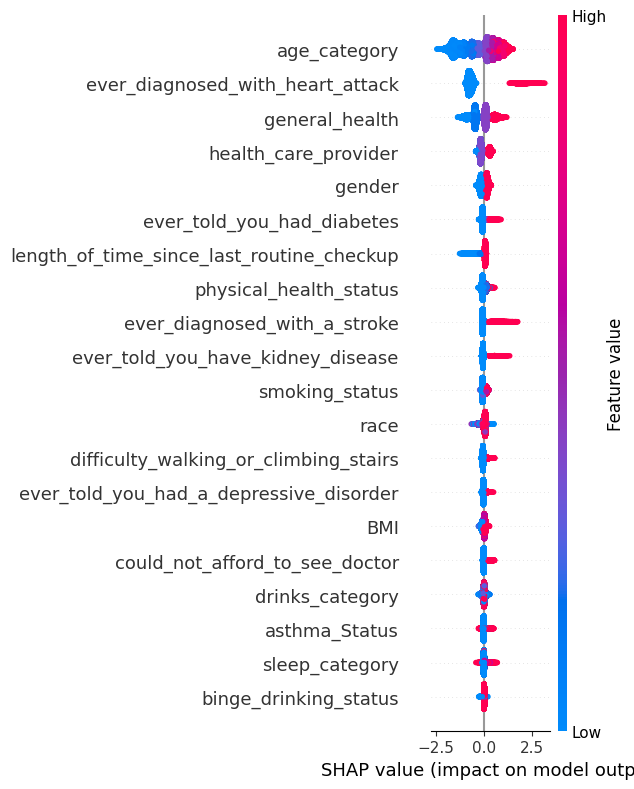

In [19]:
# Truy cập một trong các bộ ước lượng cơ sở để phân tích SHAP  
lgbm_model = best_model.estimators_[0].steps[-1][1]  

# Tạo một bộ giải thích SHAP cho LGBMClassifier  
explainer = shap.TreeExplainer(lgbm_model)  

# Tính toán giá trị SHAP cho tập kiểm tra  
shap_values = explainer.shap_values(X_test)  

# Kiểm tra xem shap_values có phải là một danh sách với nhiều lớp hay không
if isinstance(shap_values, list):  # Kiểm tra nếu là danh sách
    shap_values_class_1 = shap_values[1]  # Lớp 1, giả sử đây là lớp bệnh tim
else:
    shap_values_class_1 = shap_values  # Nếu chỉ có một lớp

# Vẽ biểu đồ tổng quan về tầm quan trọng của đặc trưng đối với bệnh tim (lớp 1):  
shap.summary_plot(shap_values_class_1, X_test, plot_size=(6,8), show=False)


### **Tóm tắt Biểu đồ SHAP Summary Plot cho Lớp 1 (Bệnh nhân mắc bệnh tim):**  

Biểu đồ SHAP trên thể hiện tác động của từng đặc trưng (feature) đến dự đoán của mô hình về nguy cơ mắc bệnh tim (**class 1**). Mỗi dấu chấm trong biểu đồ đại diện cho một giá trị SHAP của một đặc trưng, với màu sắc cho biết giá trị của đặc trưng (đỏ là giá trị cao, xanh là giá trị thấp). Dưới đây là phân tích chi tiết:

### **🔹 Ảnh hưởng Dương Cao (Tăng nguy cơ mắc bệnh tim):**  
- **Nhóm tuổi cao:** Những người lớn tuổi (dấu chấm đỏ) có nguy cơ mắc bệnh tim cao hơn. Tuổi tác là một yếu tố rủi ro quan trọng đối với bệnh tim.  
- **Tiền sử từng bị đau tim:** Người từng bị đau tim (dấu chấm đỏ) có khả năng mắc bệnh tim cao hơn, do bệnh lý tim mạch thường có xu hướng tái phát.  

### **🔹 Ảnh hưởng Dương Trung Bình:**  
- **Tình trạng sức khỏe tổng quát:** Sức khỏe kém (dấu chấm đỏ) làm tăng nguy cơ mắc bệnh tim. Những người có sức khỏe yếu thường có nguy cơ cao hơn.  
- **Từng được chẩn đoán tiểu đường:** Người từng được bác sĩ chẩn đoán tiểu đường (dấu chấm đỏ) có nguy cơ mắc bệnh tim cao hơn. Tiểu đường là yếu tố nguy cơ lớn đối với bệnh tim mạch.  
- **Giới tính:** Một số yếu tố liên quan đến giới tính (có thể là nam giới, dấu chấm đỏ) làm tăng nguy cơ mắc bệnh tim. Nam giới thường có nguy cơ cao hơn so với nữ giới ở độ tuổi trung niên.  
- **Khó đi lại hoặc leo cầu thang:** Những người gặp khó khăn khi đi lại (dấu chấm đỏ) có nguy cơ mắc bệnh tim cao hơn, do có thể liên quan đến các vấn đề tim mạch tiềm ẩn.  
- **Từng bị đột quỵ:** Tiền sử đột quỵ (dấu chấm đỏ) làm tăng nguy cơ mắc bệnh tim, vì hai bệnh này có nhiều yếu tố nguy cơ chung.  
- **Tình trạng hút thuốc:** Người hút thuốc lá (dấu chấm đỏ) có nguy cơ mắc bệnh tim cao hơn. Hút thuốc là một trong những yếu tố nguy cơ hàng đầu của bệnh tim mạch.  
- **Chỉ số BMI cao:** Người có chỉ số BMI cao (dấu chấm đỏ) có nguy cơ mắc bệnh tim cao hơn. Béo phì có mối liên hệ chặt chẽ với nguy cơ bệnh tim.  
- **Từng mắc bệnh trầm cảm:** Người có tiền sử trầm cảm (dấu chấm đỏ) có nguy cơ mắc bệnh tim cao hơn, cho thấy mối liên hệ giữa sức khỏe tâm thần và bệnh tim mạch.  
- **Tình trạng uống rượu/bia:** Tiêu thụ rượu/bia cao (dấu chấm đỏ) có liên quan đến nguy cơ mắc bệnh tim cao hơn. Việc lạm dụng rượu có thể ảnh hưởng tiêu cực đến sức khỏe tim mạch.  

### **🔹 Ảnh hưởng Hỗn Hợp (Tác động thay đổi tùy từng trường hợp):**  
- **Chủng tộc:** Một số yếu tố chủng tộc có thể ảnh hưởng đến nguy cơ mắc bệnh tim, cho thấy sự khác biệt về mặt di truyền và môi trường sống.  
- **Tình trạng hen suyễn:** Mức độ hen suyễn cao hơn có thể làm tăng nguy cơ mắc bệnh tim, do ảnh hưởng của các bệnh hô hấp mãn tính đối với tim mạch.  

### **🔹 Kết luận:**  
Biểu đồ SHAP chỉ ra rằng nhiều yếu tố như **tuổi tác, tiền sử đau tim, tình trạng sức khỏe tổng quát, tiểu đường và hút thuốc** có tác động đáng kể đến nguy cơ mắc bệnh tim. Phân tích này nhấn mạnh **tầm quan trọng của việc kiểm tra sức khỏe định kỳ, kiểm soát các bệnh mãn tính, cũng như chăm sóc sức khỏe thể chất và tinh thần** để giảm thiểu nguy cơ mắc bệnh tim. 🚀

## **Lưu Mô Hình Cuối Cùng**<a id='Saving_Final_Model'></a>  

[Contents](#Contents)  

Ở đây, chúng ta sẽ lưu mô hình tốt nhất: Easy Ensemble (LightGBM) và CatBoost.

In [20]:
import pickle
import gzip, pickletools

In [21]:

pickle_out = open("best_model.pkl", "wb")
pickle.dump(best_model, pickle_out)
pickle_out.close()

In [22]:
pickle_out = open("cbe_encoder.pkl", "wb")
pickle.dump(cbe_encoder, pickle_out)
pickle_out.close()